<img src="https://github.com/s-simin/Data_Science_Projects/blob/main/04_Multi_Classification_of_Stroke_Mild_Stroke_No_Stroke/images/proj_logo.png?raw=true" style="float: left; margin: 10px; height: 155px">  

<h1 style="font-family: Segoe UI; color: black; line-height: 1.3;"><strong>Project 4</strong><br>
Multi-Classification of Stroke, Mild Stroke and No Stroke</h1>

<div style="text-align: right;">
<h3>Authors : Suen Si Min, Lee Hongwei, Irfan Muzafar<br>
Course : DSI-SG-42</h3></div>

---

**Problem Statement:**  
How might we help patients confidently assess if they experienced a mild stroke, using a precise and sensitive classification model?

There are a total of four notebooks for this project:  
 1. `01_Data_Cleaning_EDA.ipynb`   
 2. `02_Modelling_Evaluation.ipynb`   
 3. `03_Clustering_Reclassification.ipynb`
 4. `04_Cluster_Exploration_Conclusion.ipynb`

---
**This Notebook**
- Cluster the wrongly classified datapoints from our binary classification to identify stroke, mild stroke and no stroke
- Select the best clustering algorithm for our data
- Explore clusters to observe if mild stroke can be identified

# Part 1 - Background

The previous step in our project aimed at optimising a model to classify surveyees who had a stroke and never had a stroke. As with most models, misclassifications will occur (in our context, surveyees who never had a stroke, were predicted to have a stroke or the other way round).

In the case of mild stroke or its scientific term **'Transcient Ischemic Attack (TIA)'**, we hypothesise that surveyees who have experienced mild strokes are very likely to be in the wrongly classified data set (see below for detailed explanation):

In this context, misclassification could have occured for two reasons:
1. Model error - As with most models, a perfect prediction is hard to come by. This suggests that the actual target values are accurate (Stroke/No stroke) and the wrong prediction was due to random error.
2. TIA - Some of the data points could have belonged to a third class which added on to the effect of misclassifications in our previous model. This suggests that the actual values are inaccurate.

Our aim in this notebook is to reclassify the **False positives** and **False negatives** from our previous model to 3 categories **- Stroke, Mild Stroke and No Stroke.**

---

# Part 2 - Data Processing

## 2.1 Import libraries

In [1]:
# Import necessary libraries

import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import numpy as np
import pandas as pd
import seaborn as sns
import itertools

from scipy.cluster.hierarchy import dendrogram, linkage

from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from itertools import combinations

# Set a random seed to reproduce the same results across all.
np.random.seed(42)

## 2.2 Import Cleaned Data from CSV

In [2]:
# Import and create a pandas dataframe from the wrongly classified datapoints

df = pd.read_csv('../datasets/wrongly_classified.csv')

In [3]:
# Checking the data

df.head()

,diabetes_012,highbp,highchol,bmi,smoker,heartdiseaseorattack,physactivity,fruits,veggies,hvyalcoholconsump,anyhealthcare,nodocbccost,genhlth,menthlth,physhlth,diffwalk,sex,age,education,income
0,0,0,1,33,1,0,1,0,1,0,1,1,4,30,28,0,0,4,6,2
1,0,1,1,49,1,0,0,1,1,0,1,0,3,15,1,0,0,9,6,6
2,0,0,0,26,1,0,1,1,1,0,1,0,1,0,0,0,0,9,5,6
3,0,1,0,31,0,0,0,1,1,0,1,0,3,0,0,0,1,10,4,6
4,0,1,1,34,1,0,1,0,1,0,1,0,2,0,0,0,1,7,6,7


## 2.3 Create X-values and scale

In [4]:
# Creating the X variable to be prepared for clustering

X = df

In [5]:
# Scaling the features

ss = StandardScaler()
X_sc = ss.fit_transform(X)

---

# Part 3 - Clustering Algorithm Evaluation

Based on our context, we want to identify 3 clusters within this dataframe thus we will prioritise `KMeans Clustering`, followed by `Hierarchical clustering` since we can define the clusters we want within the algorithm. We will also perform `DBScan` to identify if `density based clustering` will yield better clusters.

Given the above, we will first evaluate if 3 clusters are clearly formed between the clustering algorithm by doing the following 3 clustering evaluations.

## 3.1 KMeans Clustering Evaluation

/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will chang

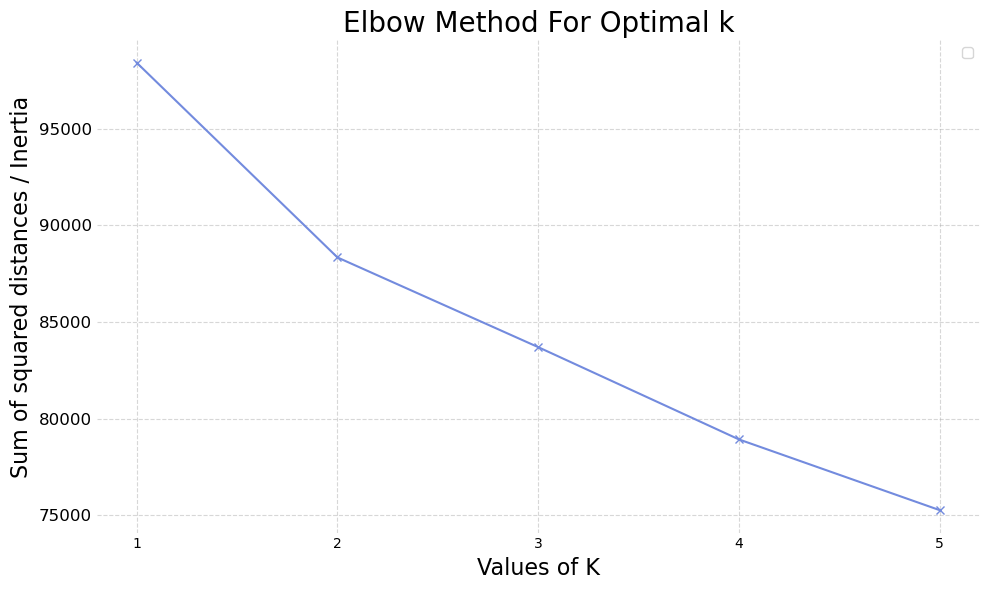

In [6]:
# Styling parameters
font_size = 14
rotation_angle = 0

# Evaluate k value in KMeans using silhouette score. To check if k=3 is a good classification
sum_of_squared_distances = []
K = range(1, 6)

# Calculate the sum of squared distance across 1 to 6 clusters
for num_clusters in K:
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(X_sc)
    
    # Inertia tells how far away the points within a cluster are.
    # Append the inertia values for each k value
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot a chart to observe if k=3 forms an elbow - this suggests that our data points can be clearly grouped into 3 clusters.

# Create a figure with a single subplot (stacked bar chart)
fig, ax = plt.subplots(figsize=(10,6))

ax.plot(K, sum_of_squared_distances,'bx-', color='#738BDE')
# Label the axes and set the title
ax.set_xlabel('Values of K', fontsize=16)
ax.set_ylabel('Sum of squared distances / Inertia', fontsize=16)
ax.set_title('Elbow Method For Optimal k', fontsize=20)

# Remove border lines around the entire plot
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)

# Remove dashes from the ticks but keep the numbers
ax.tick_params(axis='both', which='both', length=0)

# Set axis ticks and labels
ax.tick_params(axis='y', labelsize=12)
ax.set_xticks(K)

# Add grid lines
ax.grid(True, linestyle='--', alpha=0.5)

fig.patch.set_facecolor('none') # Set plot background color to be transparent
ax.set_facecolor('none') # Set inner background of the plot to be transparent
ax.legend().get_frame().set_facecolor('none') # Set legend background color to be transparent

# Show the plot
plt.tight_layout()
plt.show();

**Interpretation**
- No clear elbow formed at k=3, however there was a slight elbow formed on k=2 although not significant enough to justify 2 distinct clusters.

## 3.2 Hierarchical Clustering Evaluation

In [7]:
# Compute the linkage matrix using Ward's method on the scaled data X_sc

Z = linkage(X_sc, 'ward')

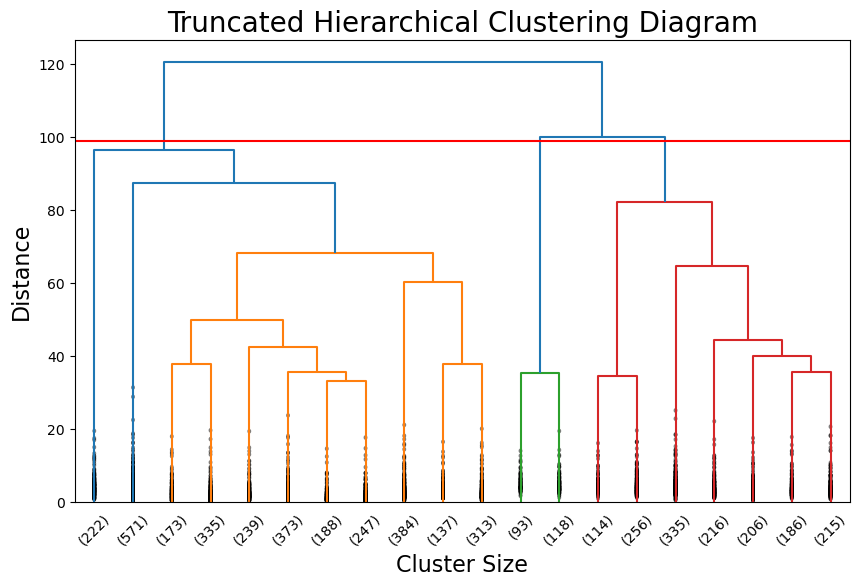

In [8]:
# Create a dendrogram using the linkage matrix Z
# Truncate the dendrogram to show the last 'p' merged clusters (20 in this case)
# Rotate the leaf labels by 45 degrees and set the font size for leaf labels
# Show contracted branches (internal nodes with only one child) for a compact view
dendrogram(Z, truncate_mode='lastp', p=20, leaf_rotation=45., leaf_font_size=15, show_contracted=True)

# Set title, x-axis label, and y-axis label for the dendrogram plot
plt.title('Truncated Hierarchical Clustering Diagram', fontsize=20)
plt.xlabel('Cluster Size', fontsize=16)
plt.ylabel('Distance', fontsize=16)

# Add a horizontal line at y=100 to visualize the clustering cut-off threshold for k=3
plt.axhline(y=99, c='red')

# Set font size for tick labels
plt.xticks(fontsize=10)

# Set background to transparent
plt.gcf().patch.set_facecolor('none')
plt.gca().patch.set_facecolor('none')

# Set the figure size
plt.gcf().set_size_inches(10, 6)

# Display the dendrogram plot
plt.show()

**Interpretation:**
<br>Based on the clusters formed by Hierarchical clustering, we can observe that the three clusters are relatively near each other. We can briefly describe our clusters spatially as follows:
* Cluster 1 (Left): Most data points are rather near each other (orange), except that it also takes in a group of 222 and 571 datapoints to its left on the dendrogram, making it a sparse cluster.
* Cluster 2 (Middle): This cluster is spatially distinct from the other clusters and is a small group on its own.
* Cluster 3 (Right): Data points within this cluster are more sparse than the other clusters as the distance between their subclusters are quite far apart.

## 3.3 DBScan Clustering Evaluation

- Since we cannot determine the number of clusters in the DBScan parameters, we will write our own GridSearch function to determine the best hyperparameters for 3 clusters, by optimizing the Silhouette Score.

In [9]:
# Set up for Grid search to find the best hyperparameters in DBScan

# Create range of parameters to search over
epsilon = np.linspace(3, 6, num=50)

min_samples = np.arange(2, 10, step = 1)

# Create a combination of the above parameters
combis = list(itertools.product(epsilon, min_samples))
len(combis)

400

In [10]:
# Define Gridsearch function
def Gridsearch(combis, X):
    # Initialize empty lists to store scores and labels for each combination
    scores = []
    all_labels = []
    num_clusters_list = []  # Store the number of clusters for all iterations

    # Iterate over each combination of parameters
    for i, (eps, num_samples) in enumerate(combis):
        # Create a DBSCAN model with the current parameters and fit it to the data
        dbscan_model = DBSCAN(eps=eps, min_samples=num_samples).fit(X)
        
        # Get the cluster labels assigned by DBSCAN
        labels = dbscan_model.labels_
        
        # Count the number of unique clusters (excluding noise points)
        labels_set = set(labels)
        num_clusters = len(labels_set)
        if -1 in labels_set:
            num_clusters -= 1  # Exclude noise points from the cluster count
        
        # Update num_clusters_list to keep track of all cluster counts
        num_clusters_list.append(num_clusters)

        # If the number of clusters is not within the desired range, skip this iteration
        if num_clusters != 3:
            scores.append(-20)  # Assign a low score as penalty
            all_labels.append("Poor")
            print("At iteration:", i, "eps =", eps, "min_samples =", num_samples,
                  "number of clusters =", num_clusters, "Skipping ..")
            continue
        
        # Calculate the silhouette score for the current clustering
        score = silhouette_score(X, labels)
        
        # Append the score and labels to the lists
        scores.append(score)
        all_labels.append(labels)
        
        # Print information about the current iteration
        print("At iteration:", i, "Score:", scores[-1], "Number of clusters:", num_clusters)
    
    # Find the index of the best performing combination based on the highest score
    best_index = np.argmax(scores)
    best_parameters = combis[best_index]
    best_labels = all_labels[best_index]
    best_score = scores[best_index]
    best_num_clusters = num_clusters_list[best_index]  # Get the corresponding num_clusters
    
    # Return the best parameters, labels, score, and num_clusters
    return {
        'best_eps': best_parameters[0],
        'best_min_samples': best_parameters[1],
        'best_labels': best_labels,
        'best_score': best_score,
        'num_clusters': best_num_clusters
    }


In [11]:
# Using the defined Gridsearch function, search for the best parameters based on the parameters defined previously
best_dbs_params = Gridsearch(combis, X_sc)

At iteration: 0 eps = 3.0 min_samples = 2 number of clusters = 82 Skipping ..
At iteration: 1 eps = 3.0 min_samples = 3 number of clusters = 36 Skipping ..
At iteration: 2 eps = 3.0 min_samples = 4 number of clusters = 14 Skipping ..
At iteration: 3 eps = 3.0 min_samples = 5 number of clusters = 8 Skipping ..
At iteration: 4 eps = 3.0 min_samples = 6 number of clusters = 7 Skipping ..
At iteration: 5 eps = 3.0 min_samples = 7 number of clusters = 8 Skipping ..
At iteration: 6 eps = 3.0 min_samples = 8 number of clusters = 6 Skipping ..
At iteration: 7 eps = 3.0 min_samples = 9 number of clusters = 5 Skipping ..
At iteration: 8 eps = 3.061224489795918 min_samples = 2 number of clusters = 73 Skipping ..
At iteration: 9 eps = 3.061224489795918 min_samples = 3 number of clusters = 28 Skipping ..
At iteration: 10 eps = 3.061224489795918 min_samples = 4 number of clusters = 12 Skipping ..
At iteration: 11 eps = 3.061224489795918 min_samples = 5 number of clusters = 7 Skipping ..
At iteration

In [12]:
print(best_dbs_params)

{'best_eps': 4.959183673469388, 'best_min_samples': 2, 'best_labels': array([0, 0, 0, ..., 0, 0, 0]), 'best_score': 0.26790104232901163, 'num_clusters': 3}


---

# Part 4 - Visual Evaluation of Each Model

- We will plot every 2D data plane to verify if we can see any distinct clusters

## 4.1 KMeans=3

### 4.1.1 Modelling

In [13]:
# KMeans = 3

# Instantiate the model
kmeans_3=KMeans(n_clusters=3)

# Fit the model on scaled X
kmeans_3.fit(X_sc)

# Create a new column in the dataframe with the labels obtained through KMeans clusters
df['kmeans_cluster'] = kmeans_3.labels_

/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [14]:
# Get Silhouette Score
silhouette_score(X_sc, kmeans_3.labels_)

0.14258182450775433

In [15]:
# Set aside a dataframe that contains labels from kmeans clustering
kmeans_df = df
# Keep this dataframe unlabelled by dropping the label column
df = df.drop(columns=['kmeans_cluster'])

### 4.1.2 Plot Scatter Plots

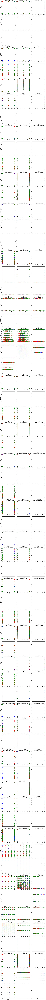

In [16]:
# Get all combinations of features
feature_combinations = list(combinations(df.columns, 2))

# Plot clusters for each pair of features
n_plots = len(feature_combinations)
n_cols = 3  # Number of columns in the subplot grid
n_rows = (n_plots + n_cols - 1) // n_cols  # Number of rows in the subplot grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

# Iterate through every two feature combinations to create a subplot each
for i, (feature1, feature2) in enumerate(feature_combinations):
    ax = axes[i]
    cluster_colors = kmeans_df['kmeans_cluster'].map({0: 'blue', 1: 'green', 2: 'red'}) # Color for each label
    ax.scatter(df[feature1], df[feature2], c=cluster_colors, s=50, alpha=0.5) # Label the datapoints by coloring clusters
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_title(f'Clusters for {feature1} vs {feature2}')

plt.tight_layout()
plt.show()

In [17]:
# Check the balance of datapoints within each cluster
kmeans_df['kmeans_cluster'].value_counts(normalize=True)

kmeans_cluster
2    0.634221
1    0.322902
0    0.042877
Name: proportion, dtype: float64

**Interpretation:**
- There seems to be no 2D plane where we can observe distinct clusters
- Cluster labeled 1 has twice more datapoints than cluster label 0

## 4.2 Agglomerative Clustering

### 4.2.1 Modelling

In [18]:
# Agglomerative clustering with 3 clusters

# Instantiate the model
hclustering_3 = AgglomerativeClustering(n_clusters=3)

# Fit the model on scaled X
hclustering_3.fit(X_sc)

# Create a new column in the dataframe for Hierarchical clustering
df['hierach_clusters'] = hclustering_3.labels_

In [19]:
# Calculate the Silhouette Score
silhouette_score(X_sc, hclustering_3.labels_)

0.11103087118382994

In [20]:
# Set asise a dataframe that contains labels from Hierarchical clustering
hcluster_df = df
# Keep this dataframe unlabelled by dropping the column of labels
df = df.drop(columns=['hierach_clusters'])

### 4.2.2 Plot Scatter Plots

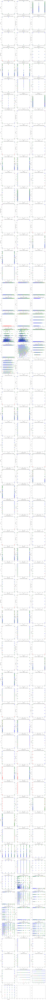

In [21]:
# Get all combinations of features
feature_combinations = list(combinations(df.columns, 2))

# Plot clusters for each pair of features
n_plots = len(feature_combinations)
n_cols = 3  # Number of columns in the subplot grid
n_rows = (n_plots + n_cols - 1) // n_cols  # Number of rows in the subplot grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

# Iterate through every two feature combinations to create a subplot each
for i, (feature1, feature2) in enumerate(feature_combinations):
    ax = axes[i]
    cluster_colors = hcluster_df['hierach_clusters'].map({0: 'blue', 1: 'green', 2: 'red'}) 
    ax.scatter(df[feature1], df[feature2], c=cluster_colors, s=50, alpha=0.5) # Label the datapoints by coloring clusters
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_title(f'Clusters for {feature1} vs {feature2}')

plt.tight_layout()
plt.show()

In [22]:
# Checking the balance of datapoints in each cluster

hcluster_df['hierach_clusters'].value_counts(normalize=True)

hierach_clusters
0    0.646617
1    0.310506
2    0.042877
Name: proportion, dtype: float64

**Interpretation:**
- Similar to KMeans, we can't observe any distinct clustering from any 2D plane across the dataset. 
- Cluster 0 has more than double the datapoints of Cluster 1

## 4.3 DBScan Clustering

### 4.3.1 Modelling

In [23]:
# Use optimal hyperparameters as evaluated by the GridSearch function above in Part 3
dbscan = DBSCAN(eps=4.96, min_samples=2) # Rounded off eps
dbscan.fit(X_sc)

DBSCAN(eps=4.96, min_samples=2)

In [24]:
# Create a new column in the dataframe with the labels obtained through DBScan
df['dbscan_cluster'] = dbscan.labels_

In [25]:
# Calculate Silhouette score
silhouette_score(X_sc, dbscan.labels_)

0.26790104232901163

In [26]:
# Set aside a dataframe that contains labels from kmeans clustering
df_dbscan = df
# Keep this dataframe unlabeled by dropping the column of labels
df = df.drop(columns='dbscan_cluster')

### 4.3.2 Plot Scatter Plots

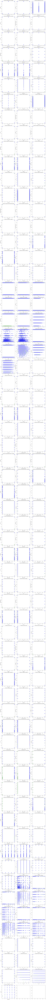

In [27]:
# Plot clusters for each pair of features
n_plots = len(feature_combinations)
n_cols = 3  # Number of columns in the subplot grid
n_rows = (n_plots + n_cols - 1) // n_cols  # Number of rows in the subplot grid
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
axes = axes.flatten()

for i, (feature1, feature2) in enumerate(feature_combinations):
    ax = axes[i]
    cluster_colors = df_dbscan['dbscan_cluster'].map({0: 'blue', 1: 'green', 2: 'red', -1: 'yellow'}) 
    ax.scatter(df[feature1], df[feature2], c=cluster_colors, s=50, alpha=0.5) # Label the datapoints by coloring clusters
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_title(f'Clusters for {feature1} vs {feature2}')

plt.tight_layout()
plt.show()

In [28]:
# Checking the balance of datapoints in each cluster
df_dbscan['dbscan_cluster'].value_counts(normalize=True)

dbscan_cluster
 0    0.957123
 1    0.041049
 2    0.001016
-1    0.000813
Name: proportion, dtype: float64

**Interpretation:**
- While we managed to yield the highest silhouette score through running many hyperparameter permutations, it did not give us distinct clusters within the dataset as more than 95% of the dataset is represented within 1 cluster

---

# Part 5 - N_Cluster Validation

While our hypothesis states that there could be 3 clusters, we cannot completely rule out the fact that there are fewer than 3, especially when the elbow plot shown above had a slight elbow at k=2, while the dendrogram shown above also showed a marginally larger distance between the last 2 clusters forming.

To verify if there are 2 distinct clusters, we will look into the silhouette scores of `KMeans` and `Hierarchical clustering` to see if there's an improvement in the scores.

In [29]:
# Checking if 2 clusters improve silhouette score significantly (KMeans)
kmeans_2 = KMeans()
kmeans_2.fit(X_sc)
silhouette_score(X_sc, kmeans_2.labels_)

/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


0.07842957472072676

In [30]:
# Checking if 2 clusters improve silhouette score significantly (Hierarchical clustering)
hcluster_2 = AgglomerativeClustering()
hcluster_2.fit(X_sc)
silhouette_score(X_sc, hcluster_2.labels_)

0.11166150937897037

**N_Cluster Evaluation:**

As shown in the table below, the comparison between silhouette scores of 2 and 3 clusters do not differ by much. In fact, our best performing clustering algorithm (KMeans) had a lower silhouette score for k=2.

|n_clusters|Algorithm|Silhouette Scores|
|---|---|---|
|3|KMeans Clustering|0.142581|
|3|Hierarchical Clustering|0.111030|
|2|KMeans Clustering|0.078429|
|2|Hierarchical Clustering|0.111661|

---

# Part 6 - Post-Clustering Evaluation:

Both `Hierarchical` and `KMeans` clustering are on par to be the best clustering algorithm for this context, despite the very low silhouette scores:

* `KMeans`: silhouette score at 0.142581
* `Hierarchical clustering`: silhouette score at 0.111030
* `DBScan`: silhouette score at 0.267901

`KMeans` and `Hierarchical clustering` is used especially when we are clear of the number of clusters we eventually want. 

As much as `KMeans` did not show a clear elbow on the k=3 on our elbow plot, `Hierarchical clustering` also did not show that the 3 final clusters were clearly distinct, in fact the distances between the 3 cluster centroids are very near.

At this point, we've also recognised that a dataset containing too many binary features restricts the optimal performance of the above clustering methods due to the following reasons:

1. Binary features have limited variability compared to continuous features. For instance, Blood Pressure and Cholesterol levels could be collected as continuous values, however due to the data collection method we are restricted to only true/false values.
2. Clustering algorithms use distance metrics to determine cluster assignments. A dataset of many binary values restricts the performance of distance-based calculations as the distance between many 0s and 1s are equal. 
3. Clustering algorithms struggle to capture nuanced relationships present in binary data. For example, data points might have different binary values but still belong to the same cluster based on their overall patterns. This is especially magnified with high dimensional dataframes as the curse of dimensionality further prevents the performance of a algorithmic-based calculations.

Since we are unable to acquire continuous values for the features, in the next section we will attempt to reduce multi-dimensionality to observe if the clusters are distinct.

---

# Part 7 - Reducing Dimensionality

## 7.1 Principal Component Analysis

To better visualise if our clusters are distinct, we can transform our dataset into principal components to reduce the number of dimensions required to represent a reasonable proportion of our data.

In [31]:
# Verifying that our df object has no predicted/true/cluster labels
df.head()

,diabetes_012,highbp,highchol,bmi,smoker,heartdiseaseorattack,physactivity,fruits,veggies,hvyalcoholconsump,anyhealthcare,nodocbccost,genhlth,menthlth,physhlth,diffwalk,sex,age,education,income
0,0,0,1,33,1,0,1,0,1,0,1,1,4,30,28,0,0,4,6,2
1,0,1,1,49,1,0,0,1,1,0,1,0,3,15,1,0,0,9,6,6
2,0,0,0,26,1,0,1,1,1,0,1,0,1,0,0,0,0,9,5,6
3,0,1,0,31,0,0,0,1,1,0,1,0,3,0,0,0,1,10,4,6
4,0,1,1,34,1,0,1,0,1,0,1,0,2,0,0,0,1,7,6,7


In [32]:
# Instantiate a PCA object
pca = PCA()

# Storing Principal Components in a new object, using scaled X values
df_pca = pca.fit_transform(X_sc)

In [33]:
# Deciding how many principal components to use by assessing how much variance is explained by derived components

# Get the explained variance ratios and round off to 3 decimal places
np.round(pca.explained_variance_ratio_, 3)

array([0.15 , 0.087, 0.071, 0.065, 0.059, 0.058, 0.052, 0.047, 0.044,
       0.042, 0.04 , 0.039, 0.037, 0.036, 0.035, 0.033, 0.031, 0.027,
       0.025, 0.021])

In [34]:
# Get a cumulative sum of each principal component's explained variance ratio
# Aim is to find how many principal components are required to represent a good proportion of the original data
pca.explained_variance_ratio_.cumsum()

array([0.14970417, 0.23626121, 0.30706986, 0.37222303, 0.43162704,
       0.48923349, 0.54114196, 0.58822595, 0.63178176, 0.67386465,
       0.71381813, 0.752662  , 0.79004753, 0.82651577, 0.86170469,
       0.89500146, 0.92584702, 0.95313922, 0.97858298, 1.        ])

**Interpretation:**
- 70% of our data is explained by the first 11 principal components. This still does not meet our objective in reducing dimensionality so that we can visualise the data easier. 

## 7.2 Reducing Number of Features Used

Based on the research stated in Notebook 1 (Section 1.6) on feature selection, 5 features (`'highbp'`, `'highchol'`, `'heartdiseaseorattack'`, `'diabetes_012'` and `'bmi'`) are stated to be the key risk factors for succumbing to stroke.

In this section, we aim to reduce the number of features to these 5 as a way of dimensionality reduction.

### 7.2.1 Preparing the new dataframe

In [35]:
df.columns

Index(['diabetes_012', 'highbp', 'highchol', 'bmi', 'smoker',
       'heartdiseaseorattack', 'physactivity', 'fruits', 'veggies',
       'hvyalcoholconsump', 'anyhealthcare', 'nodocbccost', 'genhlth',
       'menthlth', 'physhlth', 'diffwalk', 'sex', 'age', 'education',
       'income'],
      dtype='object')

In [36]:
# Create a new dataframe of only 5 key features
df_dropped = df[['highbp', 'highchol', 'heartdiseaseorattack', 'diabetes_012', 'bmi']]

In [37]:
# Scale new dataframe
df_dropped_scaled = ss.fit_transform(df)

### 7.2.2 KMeans Clustering and Evaluation

/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will chang

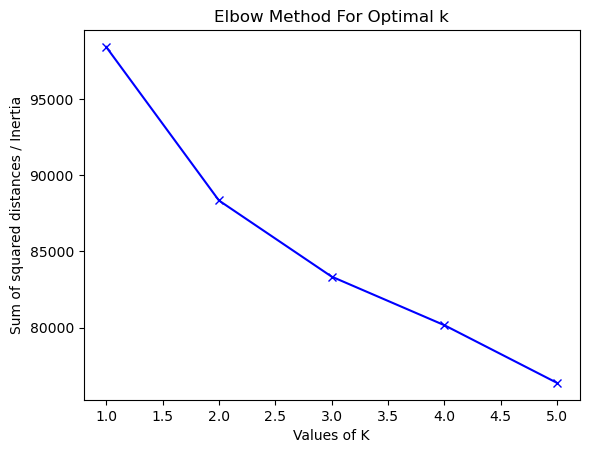

In [38]:
# Evaluate k value in KMeans using silhouette score. To check if k=3 is a good classification

sum_of_squared_distances = []
K = range(1,6)

# Calculate the sum of squared distance across 1 to 6 clusters
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(df_dropped_scaled) # Fit the model with fewer dimensions
    
    # Inertia tells how far away the points within a cluster are.
    # Append the inertia values for each k value
    sum_of_squared_distances.append(kmeans.inertia_)

# Plot a chart to observe if k=3 forms an elbow - this suggests that our data points can be clearly grouped into 3 clusters.
plt.plot(K,sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances / Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show();

In [39]:
# Calculate the silhouette score for 3 clusters on KMeans

kmeans_dropped = KMeans(n_clusters=3)
kmeans_dropped.fit(df_dropped_scaled)

# Calculating silhoutte score
silhouette_score(df_dropped_scaled, kmeans_dropped.labels_)

/Users/hongwei/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


0.12125655504670788

**Interpretation:** <br>
- The elbow plot remained mostly similar, with no clear elbow at k=3
- Silhouette score for `KMeans` also did not improve with reduced features

We will proceed to look into `Hierarchical clustering`, although we're not hopeful that the results will have a distinctive improvement.

### 7.2.3 Hierarchical Clustering and Evaluation 

In [40]:
# Compute the linkage matrix using Ward's method on the scaled data df_dropped_scaled

Z = linkage(df_dropped_scaled, 'ward')

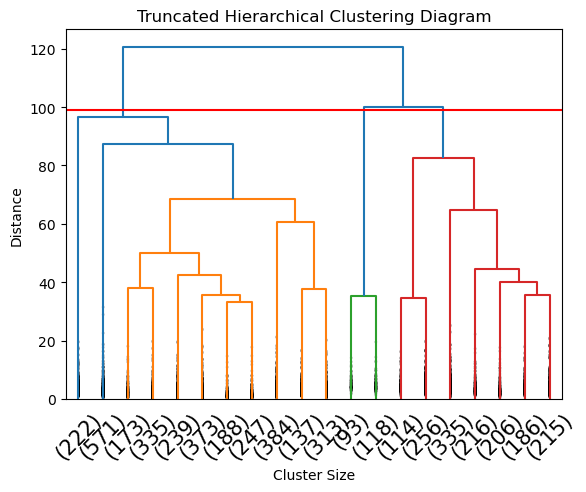

In [41]:
# Create a dendrogram using the linkage matrix Z
# Truncate the dendrogram to show the last 'p' merged clusters (20 in this case)
# Rotate the leaf labels by 45 degrees and set the font size for leaf labels
# Show contracted branches (internal nodes with only one child) for a compact view
dendrogram(Z, truncate_mode='lastp', p=20, leaf_rotation=45., leaf_font_size=15, show_contracted=True)

# Set title, x-axis label, and y-axis label for the dendrogram plot
plt.title('Truncated Hierarchical Clustering Diagram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')

# Add a horizontal line at y=100 to visualize the clustering cut-off threshold for k=3
plt.axhline(y=99, c='red')

# Display the dendrogram plot
plt.show()

In [42]:
# Calculate the silhouette score for 3 clusters on Hierarchical clustering

Hcluster_dropped = AgglomerativeClustering(n_clusters=3)
Hcluster_dropped.fit(df_dropped_scaled)

# Calculating silhoutte score
silhouette_score(df_dropped_scaled, Hcluster_dropped.labels_)

0.11103087118382994

**Interpretation:**
- As expected, there is no significant difference between both dendrogram and silhouette scores.
- We can conclude that we have no distinct clusters 

In the conclusion below, we will evaluate our data and methodology to identify reasons why no distinct clusters could be formed.

---

# Part 8 - Overall Evaluation and Conclusion

Based on our analysis of the dataset, which comprises mostly binary features (more than 50% are binary), along with the findings from PCA analysis and clustering results, we've gained valuable insights into the nature of our data:

**PCA Analysis:**

- We observed that 70% of the data variance is explained by the first 11 principal components. This indicates that the variability in our data is spread across multiple dimensions, with many dimensions contributing minimally to the overall variance.
- Data which is sparse in nature, especially with binary features like ours, tends to exhibit this behavior where information is distributed across numerous dimensions.

**Clustering Results:**

- The low silhouette scores we obtained across different clustering methods align with the challenge of identifying distinct clusters in sparse data.
- Sparse binary data, as in our case, can lead to multiple equidistant clusters, contributing to the low silhouette scores observed (Hierarchical Clustering: 0.11, KMeans: 0.12) if we force it to be only 3 clusters.

**Implications of Sparse Data:**

- The sparsity in our data, particularly with binary features, results in a high-dimensional space where many dimensions contain minimal information. This makes it difficult for clustering algorithms, like the ones we used, to discern meaningful patterns or clusters.

- The sparsity also introduces noise and reduces the signal-to-noise ratio, further complicating the task of identifying clear clusters.

**Final Conclusion:**

- Considering the sparse nature of our data, the PCA analysis highlighting high dimensionality, and the clustering results indicating low silhouette scores, it's evident that the clusters in our dataset are *not distinct*. 

- The sparsity of our data presents challenges in finding meaningful patterns or separations, even after dimensionality reduction. 

- Given the data collection nature of this dataset, to inform thresholds and patterns to identify mild stroke will require features that contain continuous variables. For example, Blood Pressure could be recorded with systolic and diastolic values, while Cholesterol could be recorded with mg/dL values. However, these values can only be accurately obtained in person through measurements obtained by medical professionals, unlike in the data collection method here which is via telephone surveys.

In the next notebook, we will perform some summary statistics with our KMeans clusters to identify if there are any patterns within the clusters. In addition, we will also include a summary of limitations, recommendations and potential cost-benefit analysis with stroke prevention from TIA.

In [43]:
# Exporting the kmeans cluster labelled dataset into a csv for the next notebook

kmeans_df.to_csv('../datasets/wrongly_classified_clusters.csv', index=False)